In [1]:
# Standard library
import logging
import os
import warnings
import pathlib as pl

# Third-party libraries
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scanpy as sc
import seaborn as sns
import shapely.wkb
import tifffile
import timm
import torch
from PIL import Image
from tqdm.notebook import tqdm
from torchvision import transforms

# Warning filters
warnings.filterwarnings("ignore", category=DeprecationWarning)
warnings.filterwarnings("ignore", category=FutureWarning)

# Download data

We provide data to run the tutorial. This data is a crop of the 5k Ovarian Cancer Xenium experiment (https://www.10xgenomics.com/datasets/xenium-prime-ffpe-human-ovarian-cancer). 

You can **download the processed tutorial data here**: https://zenodo.org/records/17594071. Once you have downloaded the data, please put it in the data/ folder of tutorials or change the paths accordingly to point to the downloaded data.

In [2]:
adata = sc.read_h5ad('data/tutadata_subset.h5ad')

What do we expect in the adata object for the method to work:
- adata.obsm['spatial']: this should contain the X and Y coordinates of the cell/nuclei centroid in the high-resolution pixel space of the associated WSI.
- adata.X: this should be the cell x gene matrix of raw counts (! this needs to be single-cell resolution data)
- (optional): adata.obs['celltype']: the annotated celltypes (here called 'major_celltype').

In [3]:
source_image_path = 'data/wsi_crop.ome.tif'

with tifffile.TiffFile(source_image_path) as tif:
    wsi = tif.series[0].asarray()

This method requires a paired H&E high-resolution image. It can also work without transcriptomic data and just with the H&E image and X and Y coordinates extracted through segmentation (see the tutorial on extracting embeddings from H&E only).

### This tutorial assumes you have the unimodal embeddings of scGPT or Nicheformer + UNI or Virchow already computed for your sample. If not, please refer to the tutorial to [generate unimodal embeddings](https://github.com/uhlerlab/spatialfusion/tree/main/tutorials/get-unimodal-ebeddings-sample.ipynb) or our [documentation to generate unimodal embeddings](https://uhlerlab.github.io/spatialfusion/unimodal-embeddings/).

# Multimodal and Spatial encoding

Once you've embedded the image and transcriptomic part, you can pass these embeddings through the pretrained multimodal AE and then through the GCMAE.

The pretrained checkpoints for the models are packaged with SpatialFusion and resolved with `resolve_pkg_ckpt`. Please use the correct pretrained weights depending on the unimodal embeddings you have generated.


## Helper functions

In [4]:
import colorsys
from typing import Optional, Sequence, Mapping, Tuple, Dict, List

import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.colors import to_rgb, to_hex
from sklearn.decomposition import PCA

def plot_embeddings(
    z1, z2, z_joint, labels, samples, label_title,
    palette="tab10", seed=42, max_cells=500_000
):

    rng = np.random.default_rng(seed)

    df = pd.DataFrame({"sample": samples, "label": labels}, index=z1.index)
    df["idx"] = np.arange(len(df))
    grouped = df.groupby("sample")

    # Determine how many cells per sample to keep
    total_samples = len(grouped)
    max_per_sample = max_cells // max(1, total_samples)

    # Subsample per sample group
    selected_indices = []
    for _, group in grouped:
        n = min(len(group), max_per_sample)
        selected_indices.extend(rng.choice(group["idx"].values, size=n, replace=False))

    # Subset everything
    z1 = z1.iloc[selected_indices]
    z2 = z2.iloc[selected_indices]
    z_joint = z_joint.iloc[selected_indices]
    labels = np.array(labels)[selected_indices]
    samples = np.array(samples)[selected_indices]

    # Apply PCA
    pca = PCA(n_components=2)
    z1_pca = pca.fit_transform(z1.values)
    z2_pca = pca.fit_transform(z2.values)
    z_joint_pca = pca.fit_transform(z_joint.values)

    # Shuffle for plot order
    #perm = rng.permutation(len(labels))
    #z1_pca = z1_pca[perm]
    #z2_pca = z2_pca[perm]
    #z_joint_pca = z_joint_pca[perm]
    #labels = labels[perm]

    # Plot
    fig, axes = plt.subplots(1, 3, figsize=(16, 5))
    point_size = 5  # keep a single source of truth for both scatter and legend markers

    def _strip_spines(ax):
        # Remove ALL spines (no plot borders)
        for spine in ax.spines.values():
            spine.set_visible(False)
        # No ticks and equal aspect
        ax.set_xticks([])
        ax.set_yticks([])
        ax.set_aspect("equal")

    def plot_scatter(ax, emb, title, show_legend=False):
        sns.scatterplot(
            x=emb[:, 0],
            y=emb[:, 1],
            hue=labels,
            palette=palette,
            s=point_size,
            ax=ax,
            linewidth=0,
            alpha=0.8,
            legend="full" if show_legend else False,
        )
        ax.set_title(title, fontsize=25)
        _strip_spines(ax)

    plot_scatter(axes[0], z1_pca, "H&E (PCA)")
    plot_scatter(axes[1], z2_pca, "RNA (PCA)")
    plot_scatter(axes[2], z_joint_pca, "Joint (PCA)", show_legend=True)

    # Extract and remove subplot legend
    handles, labels_ = axes[2].get_legend_handles_labels()
    if axes[2].legend_ is not None:
        axes[2].legend_.remove()

    # Make legend marker sizes match the scatter point size
    # (handles from seaborn are PathCollections for the color items)
    for h in handles:
        if hasattr(h, "set_sizes"):
            h.set_sizes([point_size])  # one marker per legend entry

    # Add shared figure legend (text size follows rcParams; markers already matched)
    fig.legend(
        handles,
        labels_,
        loc="center left",
        bbox_to_anchor=(1.01, 0.5),
        title=label_title,
        scatterpoints=1,     # one marker per legend entry
        markerscale=10,     # keep scale = 1 to respect set_sizes above
        frameon=False,       # optional: no border around the legend
        fontsize=16,        # control legend text size here
        title_fontsize=18,
    )

    plt.tight_layout()
    plt.show()


## Process sample

In [5]:
from spatialfusion.embed.embed import AEInputs, run_full_embedding
from spatialfusion.utils.pkg_ckpt import resolve_pkg_ckpt

Choose one H&E embedding file and one RNA embedding file for the sample. The checkpoint pair must match this choice.

| H&E model | RNA model | H&E embedding file | RNA embedding file | AE checkpoint | GCN checkpoint |
| --------- | --------- | ------------------ | ------------------ | ------------- | -------------- |
| UNI | scGPT | `UNI.parquet` | `scGPT.parquet` | `spatialfusion-ae-uni-scgpt.pt` | `spatialfusion-gcn-uni-scgpt.pt` |
| UNI | Nicheformer | `UNI.parquet` | `nicheformer.parquet` | `spatialfusion-ae-uni-nicheformer.pt` | `spatialfusion-gcn-uni-nicheformer.pt` |
| Virchow | scGPT | `Virchow2.parquet` | `scGPT.parquet` | `spatialfusion-ae-virchow-scgpt.pt` | `spatialfusion-gcn-virchow-scgpt.pt` |
| Virchow | Nicheformer | `Virchow2.parquet` | `nicheformer.parquet` | `spatialfusion-ae-virchow-nicheformer.pt` | `spatialfusion-gcn-virchow-nicheformer.pt` |

The example below loads UNI + scGPT. If you swap either embedding file, update the checkpoint filenames in the same way.


In [6]:
output_dir = pl.Path('data/')
sample_name = 'SUBSET_Xenium_Ovarian-5k'

In [16]:
he_embedding_file = "UNI.parquet"
rna_embedding_file = "scGPT.parquet"

he_df = pd.read_parquet(output_dir / he_embedding_file)
rna_df = pd.read_parquet(output_dir / rna_embedding_file)


Select the checkpoints matching the unimodal embeddings loaded above.


In [19]:
ae_model_path = resolve_pkg_ckpt("checkpoint_dir_ae/spatialfusion-ae-uni-scgpt.pt")
gcn_model_path = resolve_pkg_ckpt("checkpoint_dir_gcn/spatialfusion-gcn-uni-scgpt.pt")

Now you can obtain directly the SpatialFusion embeddings for the sample.
**Make sure you load the appropriate pretrained models, here we are using UNI + scGPT so we are using the uni_scgpt version.**

In [20]:
# can run this for several samples at a time
ae_inputs_by_sample = {
    sample_name: AEInputs(adata=adata, z_he=he_df, z_rna=rna_df),
}

# this uses the average version
emb_df = run_full_embedding(
    ae_inputs_by_sample=ae_inputs_by_sample,
    ae_model_path=ae_model_path,
    gcn_model_path=gcn_model_path, 
    device="cuda:0",
    combine_mode="average",
    spatial_key='spatial',
    celltype_key='major_celltype',
    save_ae_dir=None,  # optional
)


Running GCN inference: 100%|██████████████████████| 1/1 [00:03<00:00,  3.58s/it]


In [21]:
emb_df.head(10)

,0,1,2,3,4,5,6,7,8,9,sample_id,cell_id,celltype,X_coord,Y_coord
0,0.105722,0.099298,-0.249926,0.013971,-0.183898,-0.188563,-0.110547,0.168935,0.126048,0.299706,SUBSET_Xenium_Ovarian-5k,bodaggdc-1,Lymphocytes,8909.002585,8516.946833
1,0.103461,0.071382,-0.242062,-0.006037,-0.175699,-0.153991,-0.124108,0.162561,0.157520,0.278603,SUBSET_Xenium_Ovarian-5k,bodahgja-1,Lymphocytes,8839.379676,8573.668971
2,0.107087,0.087882,-0.246838,0.007794,-0.182903,-0.176664,-0.115847,0.168505,0.136399,0.292705,SUBSET_Xenium_Ovarian-5k,bodalbfd-1,Myeloid,8899.896676,8549.438262
3,0.037572,-0.078778,-0.246964,-0.064056,-0.075595,0.122692,-0.202476,0.095776,0.286289,0.122835,SUBSET_Xenium_Ovarian-5k,bodamehc-1,Myeloid,8062.427850,8699.193586
4,0.023426,-0.099407,-0.225532,-0.079090,-0.070667,0.132277,-0.196781,0.098642,0.276366,0.135561,SUBSET_Xenium_Ovarian-5k,bodanfem-1,Malignant,7948.017765,8781.114576
5,0.042911,-0.052489,-0.236254,-0.060673,-0.084839,0.086630,-0.195565,0.101424,0.287390,0.111435,SUBSET_Xenium_Ovarian-5k,bodangii-1,Malignant,8090.523823,8734.000379
6,0.034892,-0.091149,-0.236561,-0.064253,-0.075154,0.132361,-0.198921,0.096637,0.280908,0.116497,SUBSET_Xenium_Ovarian-5k,bodaonoh-1,Malignant,8044.218697,8709.041119
7,0.040943,-0.067320,-0.244633,-0.062780,-0.078841,0.107400,-0.197012,0.097915,0.284010,0.119128,SUBSET_Xenium_Ovarian-5k,bodapgnj-1,Malignant,8096.092915,8698.008941
8,0.029441,-0.103853,-0.247839,-0.057500,-0.067432,0.155465,-0.201170,0.091579,0.279536,0.113419,SUBSET_Xenium_Ovarian-5k,bodaplcb-1,Malignant,8041.488434,8658.176944
9,0.015861,-0.153000,-0.186100,-0.035860,-0.071418,0.168872,-0.159714,0.119335,0.224643,0.055546,SUBSET_Xenium_Ovarian-5k,bodbdiel-1,Malignant,7884.713835,8622.031773


### Running only II. multimodal encoding

If you wish, you can also obtain the intermediate multimodal AE embeddings to inspect them.

In [22]:
from spatialfusion.embed.embed import load_paired_ae, ae_from_arrays

In [25]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'

In [26]:
# Infer dimensions
d1_dim, d2_dim = ae_inputs_by_sample[sample_name].z_he.shape[1], ae_inputs_by_sample[sample_name].z_rna.shape[1]

# Load AE model
ae_model = load_paired_ae(ae_model_path, d1_dim, d2_dim, latent_dim=64, device=device)

# Run AE embedding
z1_df, z2_df, z_joint_df = ae_from_arrays(
    ae_model,
    ae_inputs_by_sample[sample_name],
    device=device,
    combine_mode="average"  # or "concat", "z1", "z2"
)


Processing AE in batches: 100%|█████████████████| 10/10 [00:00<00:00, 58.13it/s]


In [27]:
labels_ct = adata.obs['major_celltype'].ravel()
labels_subct = adata.obs['minor_celltype'].ravel()

In [28]:
samples = [sample_name for _ in range(z1_df.shape[0])]

You can observe separation the distribution of cells types in PCA space of the pre-trained multimodal AE:

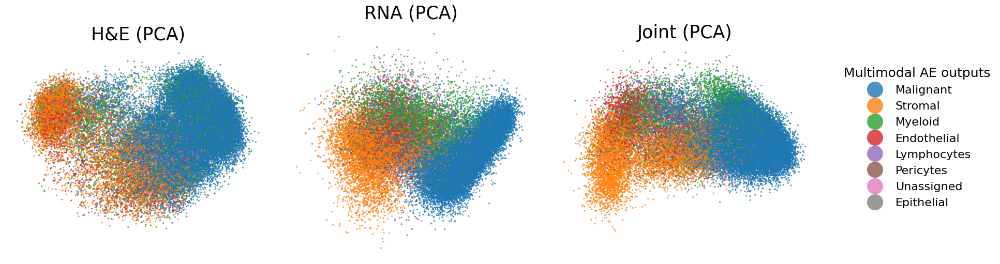

In [29]:
plot_embeddings(
    z1_df, z2_df, z_joint_df, labels_ct, samples, 'Multimodal AE outputs',
    palette="tab10", seed=42, max_cells=500_000
)

We see some separation is stronger in H&E space that RNA space, e.g., stromal cells form two clusters, and these seem to correspond to smooth muscle cells/stromal associated fibroblasts vs. tumor associated fibroblasts in the authors' annotations. Conversely, some separation is stronger in RNA space, e.g., proliferative tumor cells vs non-proliferative tumor cells. The joint space thus captures a middle ground. 

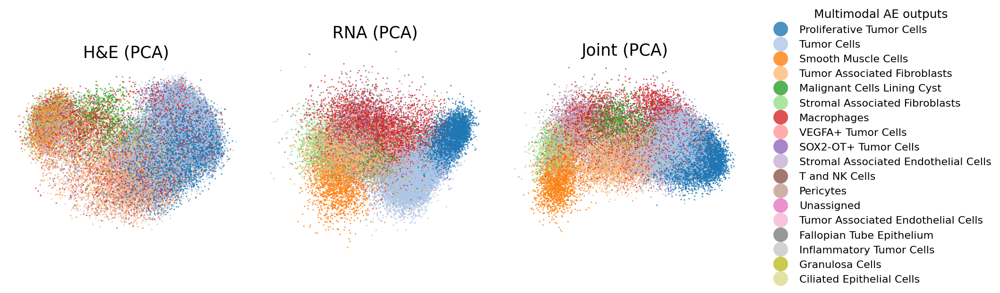

In [30]:
plot_embeddings(
    z1_df, z2_df, z_joint_df, labels_subct, samples, 'Multimodal AE outputs',
    palette="tab20", seed=42, max_cells=500_000
)

### Running only III. spatial encoding

Now you can run the GCN on the obtained embeddings.

In [31]:
from spatialfusion.embed.embed import load_gcn, gcn_embeddings_from_joint

In [32]:
# Suppose you concatenated AE joints across samples (index = cell ids from all samples)
# and you have each sample's adata in a dict.
# Keys must match the sample names you want in the output metadata.

adata_by_sample = {
    sample_name: adata,
}

gcn_model = load_gcn(gcn_model_path, in_dim=z_joint_df.shape[1], device="cuda")

gcn_emb_df = gcn_embeddings_from_joint(
    gcn_model=gcn_model,
    z_joint=z_joint_df,                # one big joint embedding over all cells
    adata_by_sample=adata_by_sample,   # per-sample AnnData objects
    base_path=".",                     # path for metadata lookups/saves
    device="cuda",
    spatial_key="spatial",             # or "spatial_px"
    celltype_key="major_celltype",
    k=30,
)


Running GCN inference: 100%|██████████████████████| 1/1 [00:00<00:00, 11.54it/s]


In [33]:
gcn_emb_df.head(10)

,0,1,2,3,4,5,6,7,8,9,sample_id,cell_id,celltype,X_coord,Y_coord
0,0.105722,0.099298,-0.249926,0.013971,-0.183898,-0.188563,-0.110547,0.168935,0.126048,0.299706,SUBSET_Xenium_Ovarian-5k,bodaggdc-1,Lymphocytes,8909.002585,8516.946833
1,0.103461,0.071382,-0.242062,-0.006037,-0.175699,-0.153991,-0.124108,0.162561,0.157520,0.278603,SUBSET_Xenium_Ovarian-5k,bodahgja-1,Lymphocytes,8839.379676,8573.668971
2,0.107087,0.087882,-0.246838,0.007794,-0.182903,-0.176664,-0.115847,0.168505,0.136399,0.292705,SUBSET_Xenium_Ovarian-5k,bodalbfd-1,Myeloid,8899.896676,8549.438262
3,0.037572,-0.078778,-0.246964,-0.064056,-0.075595,0.122692,-0.202476,0.095776,0.286289,0.122835,SUBSET_Xenium_Ovarian-5k,bodamehc-1,Myeloid,8062.427850,8699.193586
4,0.023426,-0.099407,-0.225532,-0.079090,-0.070667,0.132277,-0.196781,0.098642,0.276366,0.135561,SUBSET_Xenium_Ovarian-5k,bodanfem-1,Malignant,7948.017765,8781.114576
5,0.042911,-0.052489,-0.236254,-0.060673,-0.084839,0.086630,-0.195565,0.101424,0.287390,0.111435,SUBSET_Xenium_Ovarian-5k,bodangii-1,Malignant,8090.523823,8734.000379
6,0.034892,-0.091149,-0.236561,-0.064253,-0.075154,0.132361,-0.198921,0.096637,0.280908,0.116497,SUBSET_Xenium_Ovarian-5k,bodaonoh-1,Malignant,8044.218697,8709.041119
7,0.040943,-0.067320,-0.244633,-0.062780,-0.078841,0.107400,-0.197012,0.097915,0.284010,0.119128,SUBSET_Xenium_Ovarian-5k,bodapgnj-1,Malignant,8096.092915,8698.008941
8,0.029441,-0.103853,-0.247839,-0.057500,-0.067432,0.155465,-0.201170,0.091579,0.279536,0.113419,SUBSET_Xenium_Ovarian-5k,bodaplcb-1,Malignant,8041.488434,8658.176944
9,0.015861,-0.153000,-0.186100,-0.035860,-0.071418,0.168872,-0.159714,0.119335,0.224643,0.055546,SUBSET_Xenium_Ovarian-5k,bodbdiel-1,Malignant,7884.713835,8622.031773


In [34]:
gcn_emb_df.set_index('cell_id').to_parquet('data/SpatialFusion.parquet')

/ewsc/yatesjos/spatialfusion_env/lib/python3.10/site-packages/pandas/io/parquet.py:191: UserWarning: The DataFrame has column names of mixed type. They will be converted to strings and not roundtrip correctly.
  table = self.api.Table.from_pandas(df, **from_pandas_kwargs)


# Downstream analysis

Now that you have the embeddings, you can cluster them to obtain niches and analyze the composition of these niches and distribution in space. Here, as in the paper, we run leiden clustering.

## Helper functions

In [35]:


def plot_cluster_composition_stacked(
    df,
    cluster_key: str = "leiden",
    type_key: str = "celltypes",                 # or "cellsubtypes"
    cluster_order: Optional[Sequence[str]] = None,
    strict_order: bool = False,                  # if True, only show clusters in cluster_order
    palette: Optional[Mapping[str, str]] = None, # dict {celltype: color}; auto if None
    top_types: Optional[int] = None,             # keep top N types globally, rest→"Other"
    min_frac: Optional[float] = None,            # keep types with global frac >= min_frac, rest→"Other"
    other_label: str = "Other",
    type_order: Optional[Sequence[str]] = None,  # custom order of stack segments
    figsize=(10, 5),
    percent_labels: bool = False,                # print % on bars
    label_threshold: float = 0.05,               # only label segments >=5%
    dpi: int = 150,
):
    """
    Plot a 100% stacked barplot of type proportions per cluster using adata.obs.
    Returns a long-form DataFrame with columns: [cluster, type, count, frac, percent]
    """
    obs = df[[cluster_key, type_key]].dropna().copy()
    obs[cluster_key] = obs[cluster_key].astype(str)
    obs[type_key]    = obs[type_key].astype(str)

    # Cross-tab counts (rows=clusters, cols=types)
    ct = pd.crosstab(obs[cluster_key], obs[type_key])

    # Global filtering of rare types (optional)
    keep_cols = ct.columns.tolist()
    if top_types is not None:
        keep_cols = (
            ct.sum(axis=0)
              .sort_values(ascending=False)
              .head(top_types)
              .index.tolist()
        )
    if min_frac is not None:
        global_frac = ct.sum(axis=0) / ct.values.sum()
        keep_cols = sorted(set(keep_cols) | set(global_frac[global_frac >= min_frac].index.tolist()))
    if (top_types is not None) or (min_frac is not None):
        other = ct.drop(columns=keep_cols, errors="ignore").sum(axis=1)
        ct = ct[keep_cols].copy()
        if (other > 0).any():
            ct[other_label] = other
        # make sure "Other" is last
        ct = ct[[c for c in ct.columns if c != other_label] + ([other_label] if other_label in ct.columns else [])]

    # Normalize rows to 1.0 (100%)
    row_sums = ct.sum(axis=1).replace(0, np.nan)
    props = ct.div(row_sums, axis=0).fillna(0.0)

    # Cluster reordering
    if cluster_order is not None:
        cluster_order = [str(c) for c in cluster_order]
        missing = [c for c in cluster_order if c not in props.index]
        if strict_order:
            props = props.reindex(cluster_order).dropna(how="all")
        else:
            extras = [c for c in props.index if c not in cluster_order]
            props = props.reindex(cluster_order + extras)
        if missing:
            print(f"Warning: these clusters from cluster_order were not found and will be skipped: {missing}")
    else:
        props = props.sort_index()

    if props.empty:
        raise ValueError("No clusters to plot after filtering/reordering.")

    # Determine stack (type) order
    types_order = props.columns.tolist()
    if type_order is not None:
        type_order = [t for t in type_order if t in props.columns]
        leftovers = [t for t in props.columns if t not in type_order]
        types_order = type_order + leftovers

    # Build color map
    if palette is None:
        base = sns.color_palette("tab10", n_colors=max(10, len(types_order)))
        colmap = dict(zip(types_order, base[:len(types_order)]))
        if other_label in types_order:
            colmap[other_label] = "#B0B0B0"  # gray for "Other"
    else:
        colmap = {t: palette.get(t, "#BBBBBB") for t in types_order}

    # Plot (stacked bars)
    plt.figure(figsize=figsize, dpi=dpi)
    bottom = np.zeros(len(props))
    x = np.arange(len(props.index))
    ax = plt.gca()

    for t in types_order:
        vals = props[t].values
        ax.bar(x, vals, bottom=bottom, width=0.9, color=colmap[t], label=t, edgecolor="none")
        bottom += vals

    ax.set_xticks(x)
    ax.set_xticklabels(props.index, rotation=45, ha="right")
    ax.set_ylim(0, 1)
    ax.set_ylabel("Composition (% of cells)")
    ax.set_xlabel(cluster_key)
    ax.set_title(f"{type_key} composition per {cluster_key}")

    if percent_labels:
        for i, cl in enumerate(props.index):
            cum = 0.0
            for t in types_order:
                h = props.loc[cl, t]
                if h >= label_threshold:
                    ax.text(i, cum + h/2, f"{h*100:.0f}%", ha="center", va="center", fontsize=8, color="white")
                cum += h

    ax.legend(bbox_to_anchor=(1.02, 1), loc="upper left", title=type_key)
    plt.tight_layout()
    plt.show()

    # Long-form result for downstream use
    plot_df = (
        props.reset_index()
             .melt(id_vars=cluster_key, var_name="type", value_name="frac")
             .rename(columns={cluster_key: "cluster"})
    )
    plot_df["percent"] = (plot_df["frac"] * 100).round(2)
    counts_long = (
        ct.reset_index()
          .melt(id_vars=cluster_key, var_name="type", value_name="count")
          .rename(columns={cluster_key: "cluster"})
    )
    plot_df = plot_df.merge(counts_long, on=["cluster", "type"], how="left")
    return plot_df

def _lightness_shades(hex_color: str, n: int,
                      l_low: float = 0.35, l_high: float = 0.85) -> List[str]:
    """Generate n shades by sweeping lightness in HLS while keeping hue & saturation."""
    r, g, b = to_rgb(hex_color)
    h, l, s = colorsys.rgb_to_hls(r, g, b)
    if n <= 1:
        return [hex_color]
    Ls = np.linspace(l_low, l_high, n)
    shades = []
    for Li in Ls:
        ri, gi, bi = colorsys.hls_to_rgb(h, Li, s)
        shades.append(to_hex((ri, gi, bi)))
    return shades

def make_hierarchical_palettes(
    df,
    parent_key: str = "celltypes",
    child_key: str  = "cellsubtypes",
    parent_order: Optional[Sequence[str]] = None,   # optional desired order of lineages
    child_order: str = "alpha",                      # "alpha" or "freq"
    base_palette: Optional[Mapping[str, str]] = None,# optional {parent: hex}
    unknown_parent_color: str = "#9e9e9e",          # gray
    shade_lightness: Tuple[float, float] = (0.35, 0.85),
) -> Tuple[Dict[str, str], Dict[str, str], List[str], List[str]]:
    """
    Returns:
      parent_palette: {celltype -> hex}
      child_palette:  {cellsubtype -> hex} (shades of its parent color)
      parent_order_out: list of parents in chosen order
      child_order_out:  list of children grouped by parent in that order
    """
    obs = df[[parent_key, child_key]].copy()
    obs[parent_key] = obs[parent_key].astype(str)
    obs[child_key]  = obs[child_key].astype(str)

    # Parents present and their order
    parents = obs[parent_key].unique().tolist()
    if parent_order is not None:
        parent_order = [str(x) for x in parent_order]
        # keep requested order, append unseen parents at the end
        extra = [p for p in parents if p not in parent_order]
        parent_order_out = parent_order + extra
    else:
        # default: sort by global frequency, then alphabetically
        freq = obs[parent_key].value_counts()
        parent_order_out = (freq.index.tolist() +
                            [p for p in parents if p not in freq.index])

    # Children per parent
    children_per_parent = {}
    for p in parents:
        sub = obs.loc[obs[parent_key] == p, child_key]
        if child_order == "freq":
            children = sub.value_counts().index.tolist()
        else:
            children = sorted(sub.unique().tolist())
        children_per_parent[p] = children

    # Base colors for parents
    if base_palette is not None:
        parent_palette = {p: base_palette.get(p, unknown_parent_color) for p in parent_order_out}
    else:
        # distinct hues for parents
        n_par = len(parent_order_out)
        if n_par <= 10:
            base = sns.color_palette("tab10", n_colors=n_par)
        else:
            base = sns.color_palette("hls", n_colors=n_par)
        parent_palette = {p: to_hex(base[i]) for i, p in enumerate(parent_order_out)}

    # Shades for children
    child_palette = {}
    child_order_out = []
    l_low, l_high = shade_lightness
    for p in parent_order_out:
        base_col = parent_palette.get(p, unknown_parent_color)
        kids = children_per_parent.get(p, [])
        shades = _lightness_shades(base_col, max(1, len(kids)), l_low=l_low, l_high=l_high)
        for k, col in zip(kids, shades):
            child_palette[k] = col
        child_order_out.extend(kids)

    return parent_palette, child_palette, parent_order_out, child_order_out


## Analysis

In [36]:
embeddings_df = pd.read_parquet('data/SpatialFusion.parquet')

In [37]:
adata.obsm['SpatialFusion'] = embeddings_df.loc[adata.obs_names,['0','1','2','3','4','5','6','7','8','9']]

In [92]:
sc.pp.neighbors(adata, use_rep='SpatialFusion')

In [93]:
sc.tl.leiden(adata, resolution=0.04, flavor="igraph", n_iterations=2)

In [94]:
adata.obs.leiden.value_counts()

leiden
1    29184
0     6809
2     6564
3     2932
4     1202
Name: count, dtype: int64

In [95]:
adata.obs.leiden = adata.obs.leiden.astype(str).astype('category')

In [96]:
plt.style.use('default')

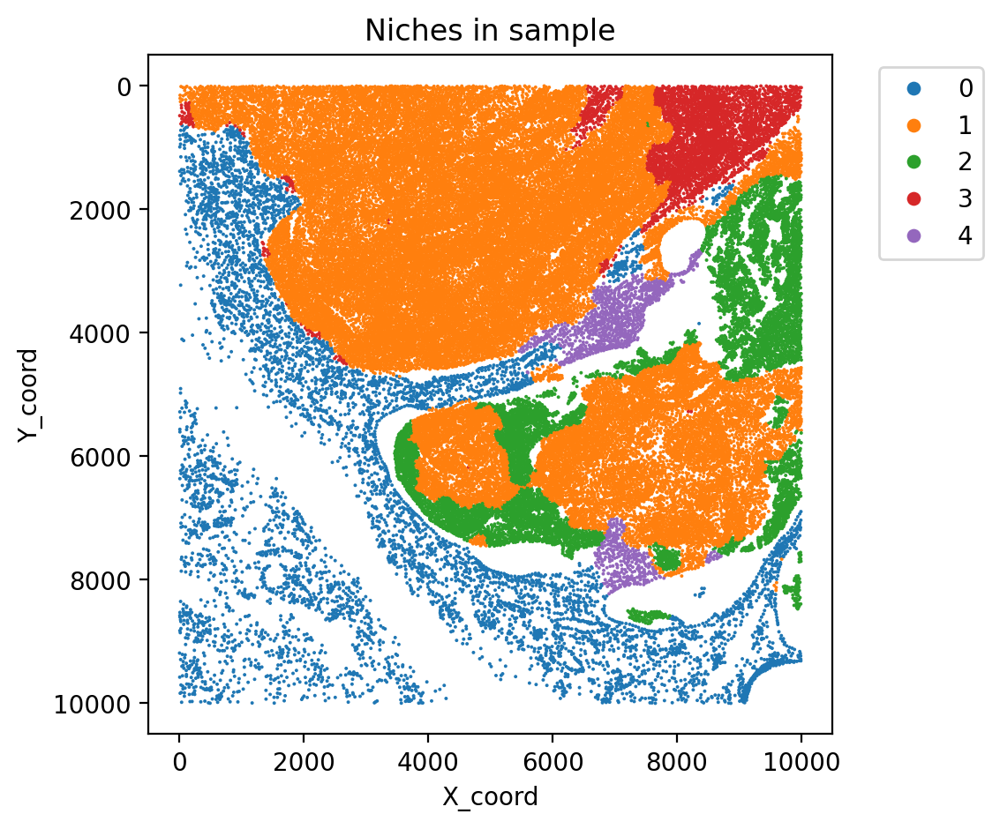

In [97]:
plt.figure(figsize=(5,5))
sns.scatterplot(
    data=adata.obs,
    x='X_coord', y='Y_coord',
    hue='leiden',
    palette="tab10",
    s=2,
    linewidth=0
)
plt.gca().invert_yaxis()
plt.title("Niches in sample")

plt.legend(
    bbox_to_anchor=(1.05, 1),
    loc="upper left",
    scatterpoints=1,
    markerscale=4
)


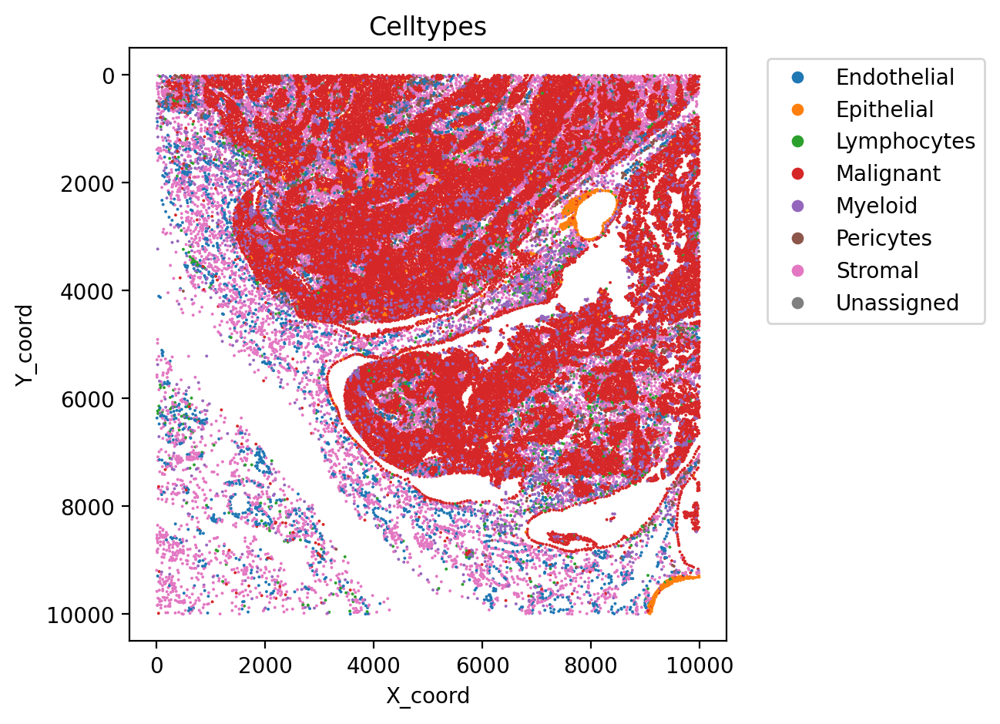

In [98]:
plt.figure(figsize=(5,5))
sns.scatterplot(
    data=adata.obs,
    x='X_coord', y='Y_coord',
    hue='major_celltype',
    palette='tab10',
    s=2,
    linewidth=0
)
plt.gca().invert_yaxis()
plt.title("Celltypes")

plt.legend(
    bbox_to_anchor=(1.05, 1),
    loc="upper left",
    scatterpoints=1,
    markerscale=4
)


You can characterize the niches in terms of their cell type composition

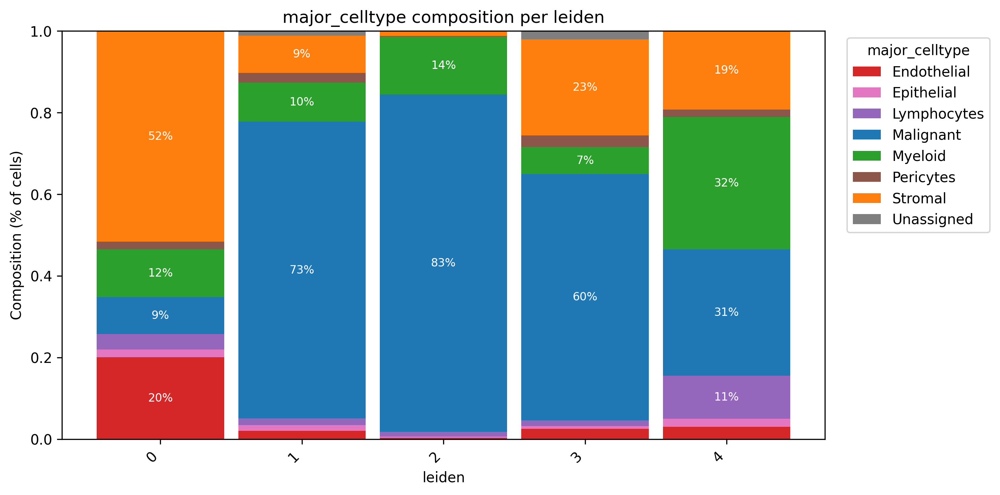

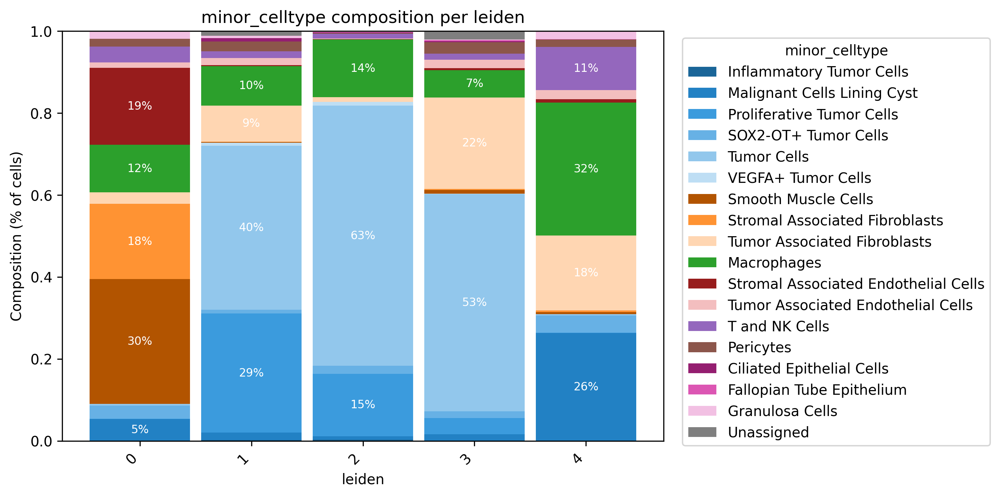

In [99]:
# Build coherent palettes & orders
parent_pal, child_pal, parent_order, child_order = make_hierarchical_palettes(
    adata.obs,
    parent_key="major_celltype",
    child_key="minor_celltype",
    # Optionally enforce your own lineage order:
    # parent_order=["Immune","Stromal","Endothelial","Epithelial","Adipocyte"],
    child_order="alpha",                 # or "freq"
    shade_lightness=(0.35, 0.85)
)

# (A) 100% stacked bars by lineage (coarse)
plot_df_types = plot_cluster_composition_stacked(
    adata.obs,
    cluster_key="leiden",
    type_key="major_celltype",
    cluster_order=["0","1","2","3","4",],  # your preferred cluster order
    strict_order=False,
    palette=parent_pal,
    percent_labels=True
)

# (B) 100% stacked bars by subtypes (fine), colors are shades within lineage color
plot_df_subtypes = plot_cluster_composition_stacked(
    adata.obs,
    cluster_key="leiden",
    type_key="minor_celltype",
    cluster_order=["0","1","2","3","4",],
    strict_order=False,
    palette=child_pal,
    # NEW: order subtypes grouped by their parent lineage
    type_order=child_order,              # requires tiny tweak shown above
    percent_labels=True
)


You can also visualize the distribution of niches overlaid on H&E

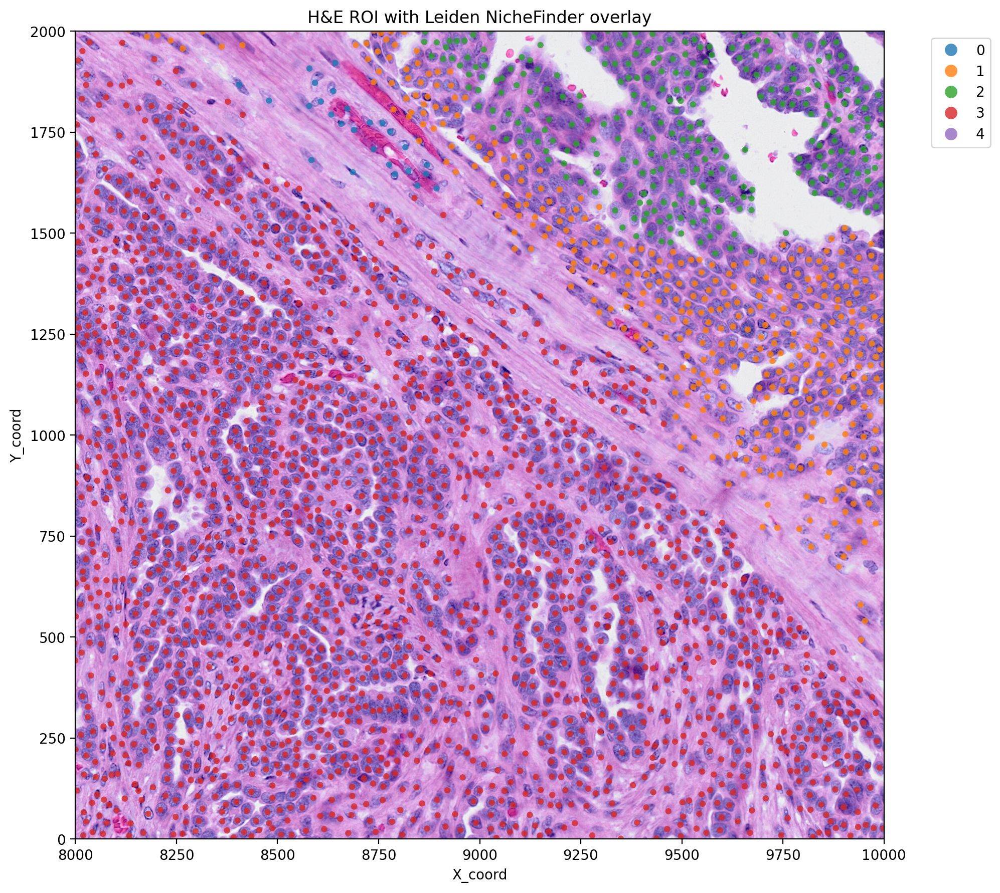

In [100]:
import matplotlib.pyplot as plt
import seaborn as sns

# --- Region of interest in H&E pixel space
xlim = (8000, 10000)
ylim = (0, 2000)

x0, x1 = xlim
y0, y1 = ylim

# --- Crop ROI from the WSI
roi = wsi[y0:y1, x0:x1, :]  # note: numpy indexing is [row=y, col=x]

fig, ax = plt.subplots(figsize=(10, 10))

# Show the H&E ROI
ax.imshow(roi, origin="upper", extent=(x0, x1, y1, y0))  
# ^ extent maps the array coords into the same coordinate system as X_he, Y_he
#   origin="upper" keeps top-left = (0,0)

# Overlay scatter using aligned coords
sns.scatterplot(
    data=adata.obs,
    x="X_coord", y="Y_coord",
    hue="leiden",          # categorical cluster
    palette="tab10",
    s=20, alpha=0.8,
    ax=ax,
    linewidth=0
)

# Match the crop window
ax.set_xlim(x0, x1)
ax.set_ylim(y1, y0)  # because origin="upper" flips Y
ax.invert_yaxis()
plt.legend(
    bbox_to_anchor=(1.05, 1),
    loc='upper left',
    scatterpoints=1,       # how many points to show per entry
    markerscale=2          # scale factor for the legend markers
)
ax.set_title("H&E ROI with Leiden NicheFinder overlay")

plt.tight_layout()
plt.show()


# Finetune model

We can also easily fine-tune the model to a dataset we have. For this however we need to make sure we have the pathway matrix computed with PROGENy.

## Pathway matrix

### Helper functions

In [47]:
import argparse
import warnings
from pathlib import Path
from typing import List, Tuple, Dict

import numpy as np
import pandas as pd
import scanpy as sc
import decoupler as dc
from tqdm import tqdm

import matplotlib.pyplot as plt
import seaborn as sns

warnings.filterwarnings("ignore", category=FutureWarning)
sc.set_figure_params(figsize=(3, 3), frameon=False)

def get_pathway_score(
    adata: sc.AnnData,
    spatial_key: str = "spatial_he",
    bw: int = 100,
    cutoff: float = 0.1,
    net: pd.DataFrame = None,
) -> Tuple[sc.AnnData, sc.AnnData]:
    """
    Compute pathway activation using decoupler (ULM), after spatial smoothing with KNN on coordinates.

    Steps:
      1) normalize_total + log1p
      2) store normalized counts in adata.layers["norm"]
      3) build spatial KNN graph via dc.pp.knn(..., key=spatial_key)
      4) smooth adata.X with graph connectivities
      5) run dc.mt.ulm to compute scores -> stored in adata.obsm['score_ulm']

    Returns the modified AnnData and the same object for convenience.
    """
    sc.pp.normalize_total(adata, target_sum=1e4)
    sc.pp.log1p(adata)

    adata.layers["norm"] = adata.X.copy()
    dc.pp.knn(adata, key=spatial_key, bw=bw, cutoff=cutoff)
    adata.X = adata.obsp[f"{spatial_key}_connectivities"].dot(adata.X)

    dc.mt.ulm(data=adata, net=net)
    _ = dc.pp.get_obsm(adata=adata, key="score_ulm")
    return adata, adata

### Compute pathway

In [48]:
net_df = dc.op.progeny(organism='human')

In [49]:
# these are the pathways selected in this work
keep_cols = ['Androgen','EGFR','Estrogen','JAK-STAT','MAPK','NFkB','PI3K',
             'TGFb','TNFa','VEGF']

In [50]:
# Compute scores
_, adata_scored = get_pathway_score(
    adata, spatial_key='spatial', bw=100, cutoff=0.1, net=net_df
)

# Keep only requested pathways (if present)
score_df = adata_scored.obsm["score_ulm"]
existing = [p for p in keep_cols if p in score_df.columns]
if not existing:
    # If none of the requested pathways exist, keep all
    existing = list(score_df.columns)
score_df = score_df.loc[:, existing]

In [51]:
# Save
out_path = 'data/pathway_matrix.parquet'
score_df.to_parquet(out_path)

## Run finetuning

In [52]:
from spatialfusion.finetune.finetune import finetune_models

We put the data into the same system as for inference

In [53]:
adatas = {sample_name: adata}

preloaded_data = {
    sample_name: (he_df.loc[adata.obs_names], rna_df.loc[adata.obs_names])
}

preloaded_pathway_data = {
    sample_name: pathway_matrix.loc[adata.obs_names]
}


In [54]:
adatas = {sample_name: adata}

preloaded_data = {
    sample_name: (he_df.loc[adata.obs_names], rna_df.loc[adata.obs_names])
}

preloaded_pathway_data = {
    sample_name: pathway_matrix.loc[adata.obs_names]
}


And like before we specify the model we want to train as well as where to save the finetuned model.

In [55]:
ae_model_path = resolve_pkg_ckpt("checkpoint_dir_ae/spatialfusion-ae-uni-scgpt.pt")
gcn_model_path = resolve_pkg_ckpt("checkpoint_dir_gcn/spatialfusion-gcn-uni-scgpt.pt")

In general, we keep the epochs small; try between 5 and 15 epochs for the AE and/or GCN.
On a A6000 GPU this takes <30 sec.

In [56]:
finetune_models(
    samples=[sample_name],
    pretrained_ae=ae_model_path,
    pretrained_gcn=gcn_model_path, 
    save_dir='data/finetuned_model',
    preloaded_data=preloaded_data,   
    adatas=adatas,                  
    preloaded_pathway_data=preloaded_pathway_data,
    ae_epochs=5,
    gcn_epochs=5,
    ae_batch_size=128,
    gcn_batch_size=2,
    latent_dim=64,
    knn_k=30,
    subgraph_size=5000,
    stride=2500,
    use_cls_loss=True,
    spatial_key='spatial',
)

[AE 1] total=0.8890


[AE 2] total=0.8474


[AE 3] total=0.8176


[AE 4] total=0.7957


[AE 5] total=0.7804


[SUBSET_Xenium_Ovarian-5k] Using preloaded pathway activation data.
[SUBSET_Xenium_Ovarian-5k] Attached 10 label dimensions.


[GCN 1] total=1.3268


[GCN 2] total=1.3093


[GCN 3] total=1.2689


[GCN 4] total=1.2827


[GCN 5] total=1.3003
✓ Finetuning complete.


(PairedAE(
   (encoder1): EncoderAE(
     (model): Sequential(
       (0): Linear(in_features=1536, out_features=64, bias=True)
       (1): ReLU()
       (2): Linear(in_features=64, out_features=64, bias=True)
     )
   )
   (encoder2): EncoderAE(
     (model): Sequential(
       (0): Linear(in_features=512, out_features=64, bias=True)
       (1): ReLU()
       (2): Linear(in_features=64, out_features=64, bias=True)
     )
   )
   (decoder1): Decoder(
     (net): Sequential(
       (0): Linear(in_features=64, out_features=64, bias=True)
       (1): ReLU()
       (2): Linear(in_features=64, out_features=1536, bias=True)
     )
   )
   (decoder2): Decoder(
     (net): Sequential(
       (0): Linear(in_features=64, out_features=64, bias=True)
       (1): ReLU()
       (2): Linear(in_features=64, out_features=512, bias=True)
     )
   )
 ),
 GCNAutoencoder(
   (gcn_layers): ModuleList(
     (0): GraphConv(in=64, out=10, normalization=both, activation=None)
     (1): GraphConv(in=10, out=10

## Embed finetuned


In [57]:
ae_inputs_by_sample = {
    sample_name: AEInputs(adata=adata, z_he=he_df, z_rna=rna_df),
}


In [58]:
# this uses the average version
embeddings_finetuned_df = run_full_embedding(
    ae_inputs_by_sample=ae_inputs_by_sample,
    ae_model_path='data/finetuned_model/paired_model_finetuned.pt',
    gcn_model_path='data/finetuned_model/gcn_finetuned/model.pt',
    device="cuda:0",
    combine_mode="average",
    spatial_key='spatial',
    celltype_key=None,
    save_ae_dir=None,  # optional
)

Running GCN inference: 100%|██████████████████████| 1/1 [00:00<00:00, 12.10it/s]


In [59]:
embeddings_finetuned_df.set_index('cell_id').to_parquet('data/SpatialFusion_finetuned.parquet')

/ewsc/yatesjos/spatialfusion_env/lib/python3.10/site-packages/pandas/io/parquet.py:191: UserWarning: The DataFrame has column names of mixed type. They will be converted to strings and not roundtrip correctly.
  table = self.api.Table.from_pandas(df, **from_pandas_kwargs)


# Compare finetuned and pre-trained

## Analysis

In [60]:
embeddings_df = pd.read_parquet('data/SpatialFusion.parquet')
embeddings_df_finetuned = pd.read_parquet('data/SpatialFusion_finetuned.parquet')

In [61]:
adata.obsm['SpatialFusion'] = embeddings_df.loc[adata.obs_names,['0','1','2','3','4','5','6','7','8','9']]
adata.obsm['SpatialFusion_finetuned'] = embeddings_df_finetuned.loc[adata.obs_names,['0','1','2','3','4','5','6','7','8','9']]

In [80]:
sc.pp.neighbors(adata, use_rep='SpatialFusion')

In [81]:
sc.tl.leiden(adata, resolution=0.04, flavor="igraph", n_iterations=2)

In [82]:
adata.obs.leiden.value_counts()

leiden
1    29184
0     6809
2     6564
3     2932
4     1202
Name: count, dtype: int64

In [83]:
adata.obs.leiden = adata.obs.leiden.astype(str).astype('category')

In [84]:
adata.obs['SpatialFusion_niche'] = adata.obs.leiden

In [85]:
sc.pp.neighbors(adata, use_rep='SpatialFusion_finetuned')

In [86]:
sc.tl.leiden(adata, resolution=0.04, flavor="igraph", n_iterations=2)

In [87]:
adata.obs.leiden.value_counts()

leiden
1    30304
3     7486
2     5853
0     3041
4        7
Name: count, dtype: int64

In [88]:
adata.obs.leiden = adata.obs.leiden.astype(str).astype('category')

In [89]:
adata.obs['SpatialFusion_finetuned_niche'] = adata.obs.leiden

In [90]:
plt.style.use('default')

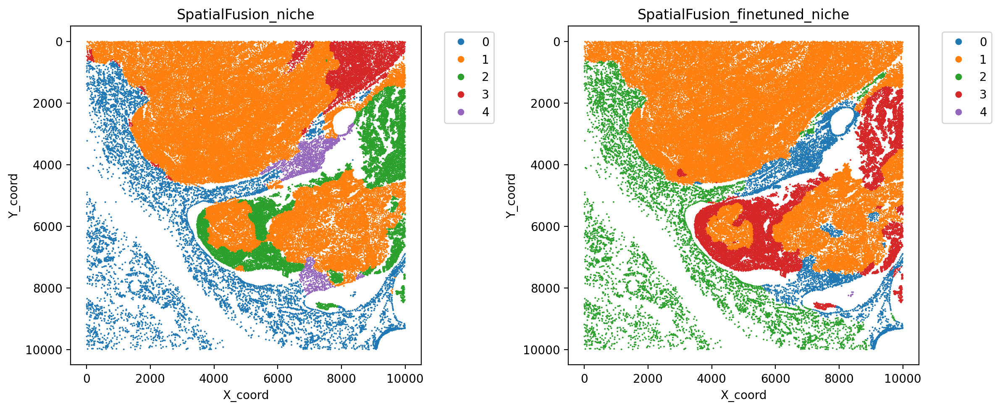

In [91]:
import matplotlib.pyplot as plt
import seaborn as sns

fig, axes = plt.subplots(1, 2, figsize=(12, 5))

# ---- Plot 1: SpatialFusion_niche ----
sns.scatterplot(
    data=adata.obs,
    x='X_coord', y='Y_coord',
    hue='SpatialFusion_niche',
    palette="tab10",
    s=2,
    linewidth=0,
    ax=axes[0]
)
axes[0].invert_yaxis()
axes[0].set_title("SpatialFusion_niche")
axes[0].legend(
    bbox_to_anchor=(1.05, 1),
    loc="upper left",
    scatterpoints=1,
    markerscale=4
)

# ---- Plot 2: SpatialFusion_finetuned_niche ----
sns.scatterplot(
    data=adata.obs,
    x='X_coord', y='Y_coord',
    hue='SpatialFusion_finetuned_niche',
    palette="tab10",
    s=2,
    linewidth=0,
    ax=axes[1]
)
axes[1].invert_yaxis()
axes[1].set_title("SpatialFusion_finetuned_niche")
axes[1].legend(
    bbox_to_anchor=(1.05, 1),
    loc="upper left",
    scatterpoints=1,
    markerscale=4
)

plt.tight_layout()
plt.show()
